In [10]:
import requests
import json
import typing as tp

In [56]:
api_version = "5.131"
access_token = "<removed>"

In [57]:
def request_url(method_name, params):
  url = "https://api.vk.com/method/{method_name}?{params}&v={api_version}".format(
      method_name=method_name, params=params, api_version=api_version)

  if access_token:
    url = "%s&access_token=%s" %(url, access_token)

  return url

In [70]:
r = requests.get(request_url("friends.get", "user_id=%s&fields=uid,sex&access_token=%s" % ('', access_token))).json()

In [71]:
len(r['response']['items'])

837

In [68]:
with open("my_friends", "w") as mf:
  json.dump(r, mf) 

In [ ]:
my_friends_friends: tp.Dict[int, tp.Any] = dict()

In [ ]:
for item in r['response']['items']:
  frr = requests.get(request_url("friends.get", "user_id=%s&fields=uid&access_token=%s" % (item['id'], access_token))).json()
  my_friends_friends[item['id']] = frr

In [ ]:
with open("my_friends_friends", "w") as mf:
  json.dump(my_friends_friends, mf) 

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! mkdir /content/drive/MyDrive/friends_analysis

In [61]:
! cp my_friends my_friends_friends /content/drive/MyDrive/friends_analysis

In [4]:
! cp /content/drive/MyDrive/friends_analysis/* .

In [5]:
def load_from_json(path):
  with open(path) as f:
    return json.load(f)

In [11]:
my_friends = load_from_json('my_friends')

In [12]:
mff = load_from_json('my_friends_friends')

In [64]:
def get_my_friends_ids(mf) -> tp.List[int]:
  return [item['id'] for item in my_friends['response']['items']]

def get_my_friends_id_to_name(mf) -> tp.List[int]:
  return {item['id']: " ".join([item["last_name"], item["first_name"]]) for item in my_friends['response']['items']}


In [14]:
my_friends_ids = get_my_friends_ids(my_friends)
assert(len(my_friends_ids) == 837)
my_friends_id_to_name = get_my_friends_id_to_name(my_friends)
assert(len(my_friends_id_to_name) == 837)

In [15]:
list(mff.items())[:1]

[('13664',
  {'response': {'count': 645,
    'items': [{'can_access_closed': True,
      'first_name': 'Andrey',
      'id': 14,
      'is_closed': False,
      'last_name': 'Gorodetsky',
      'track_code': '17e05190WKev2eKOsYfat-SVp5qdEomcaAmqHB_nQO9Z6qAeM4M1zKK7hYrguY_gliwWTlMQ'},
     {'can_access_closed': True,
      'first_name': 'Alexander',
      'id': 17,
      'is_closed': False,
      'last_name': 'Bespalov',
      'track_code': '9b1f5dbd9RffqRMFuSY94_auwxgTrV5UNW6t_rTMhKzgF7Sk5OqYfIzKJFG6FmCyhRdyzN2v'},
     {'can_access_closed': True,
      'first_name': 'Ekaterina',
      'id': 54,
      'is_closed': False,
      'last_name': 'Furtikova',
      'track_code': 'b96a4a0b674_BWM75tEMeMwrJBzupm-IlAcwUFDgFtqLMWjOfzaG1TJhAjjjsVkqvJKVyCCk'},
     {'can_access_closed': False,
      'first_name': 'Alexey',
      'id': 172,
      'is_closed': True,
      'last_name': 'Gorodetsky',
      'track_code': 'f8dea73fFB8fgjbF2PLzrL5OnCwhBHXvKMTv973hmGysOQcLnAR5dEGxVsfY85ei3O4j750GZw'},
    

In [16]:
import networkx as nx

In [17]:
G = nx.Graph()

In [18]:
def build_my_friends_graph(mf, mff, include_not_my=False, include_me=False):
  id_to_name = get_my_friends_id_to_name(mf)
  if include_me:
    id_to_name[0] = "Eugene Gostkin"

  nodes = id_to_name
  G = nx.Graph()
  G.add_nodes_from(nodes)
  edges = []
  mapping = {}
  for friend_id in nodes:
    G.nodes[friend_id]['name'] = id_to_name[friend_id]
    if friend_id == 0:
      continue
    if include_me:
      edges.append((friend_id, 0))
    if 'response' not in mff[str(friend_id)].keys():
      continue
    for friends_friend in mff[str(friend_id)]['response']['items']:
      if include_not_my or int(friends_friend['id']) in nodes:
        edges.append((friend_id, int(friends_friend['id'])))
  print(len(edges))
  G.add_edges_from(edges)
  return G

In [19]:

G = build_my_friends_graph(my_friends, mff)

34870


In [20]:
G.nodes[13664]

{'name': 'Frantsuzov Grigory'}

In [21]:
import matplotlib.pyplot as plt

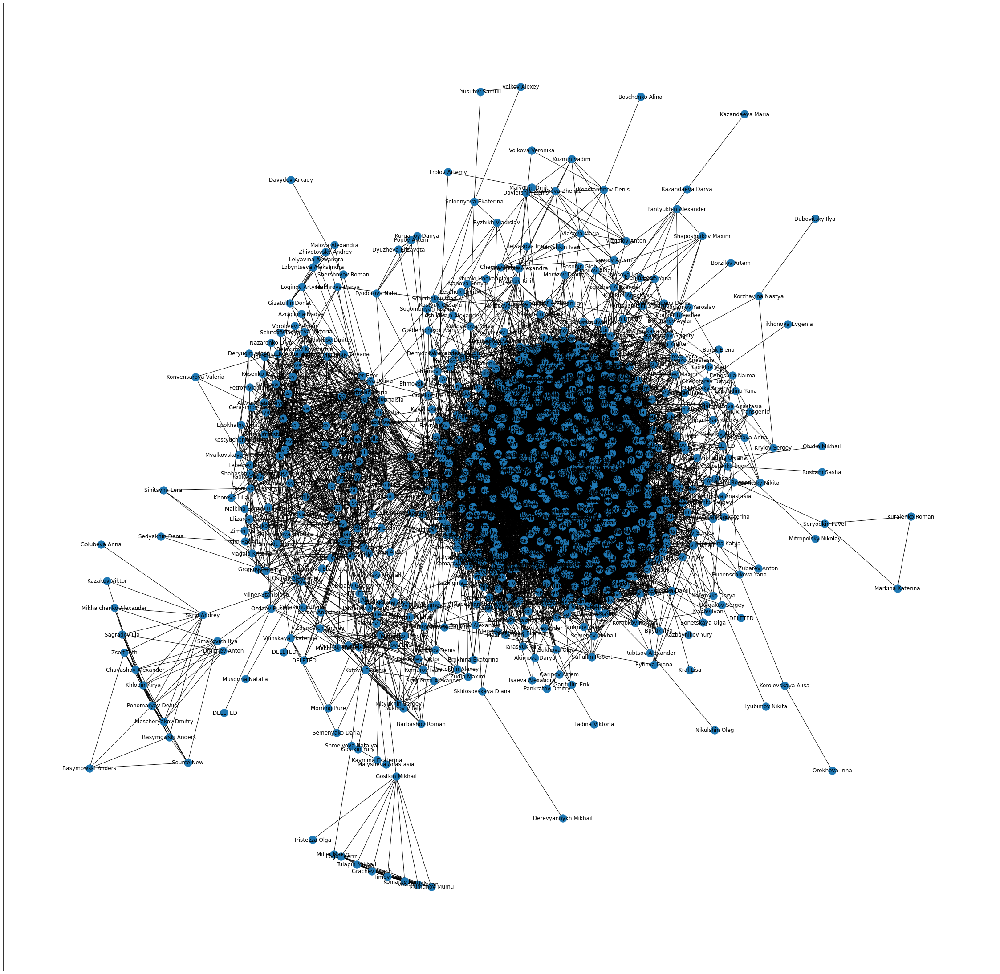

In [22]:
plt.figure(figsize=(40, 40))
nx.draw_networkx(G, 
                 pos = nx.kamada_kawai_layout(G),
                 labels = {node: G.nodes[node]['name'] for node in G.nodes})

In [23]:
nx.is_connected(G)

False

In [24]:
conn_components = list(nx.connected_components(G))

In [25]:
len(conn_components)

40

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


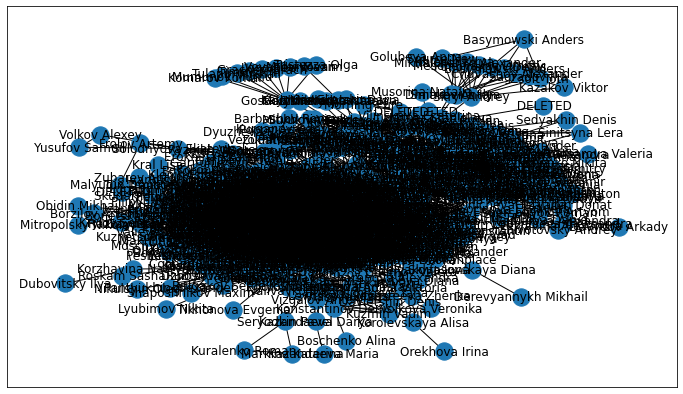

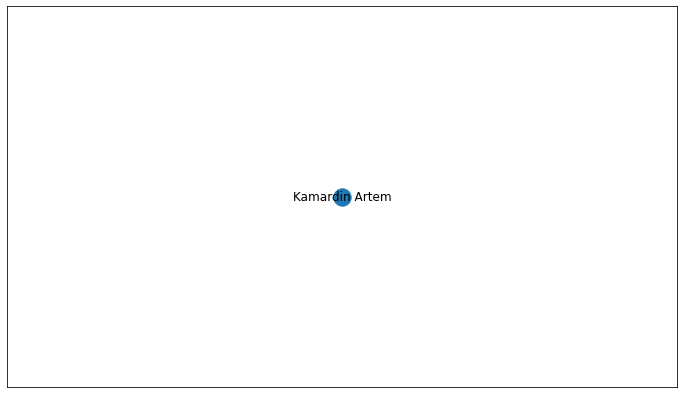

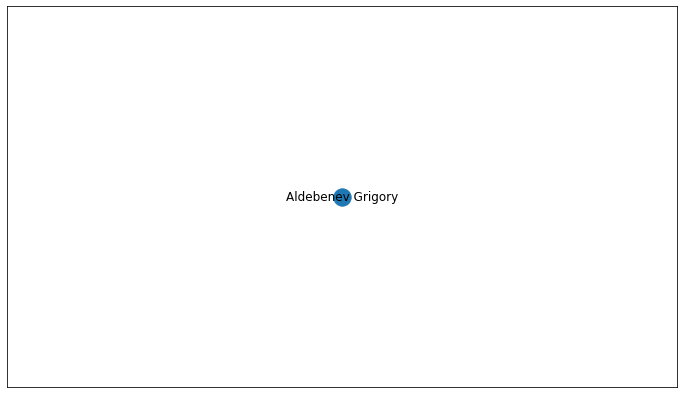

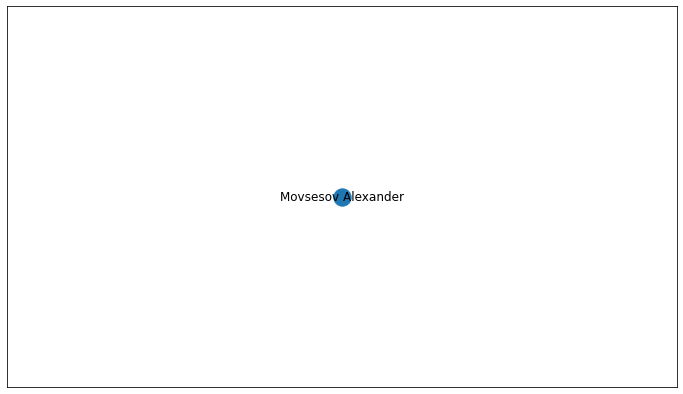

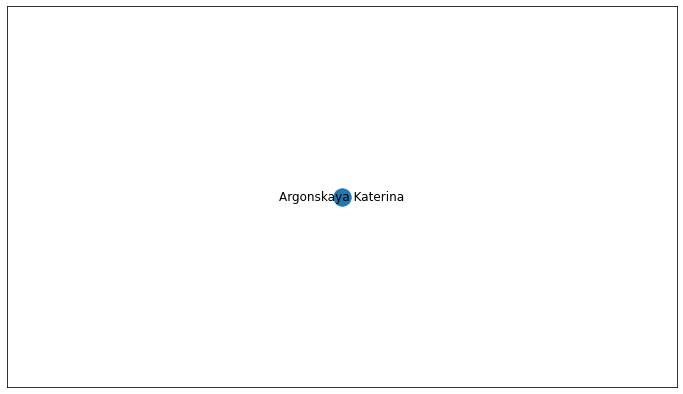

...

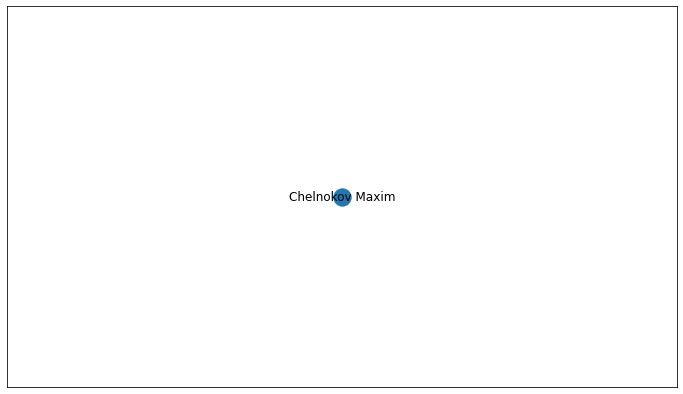

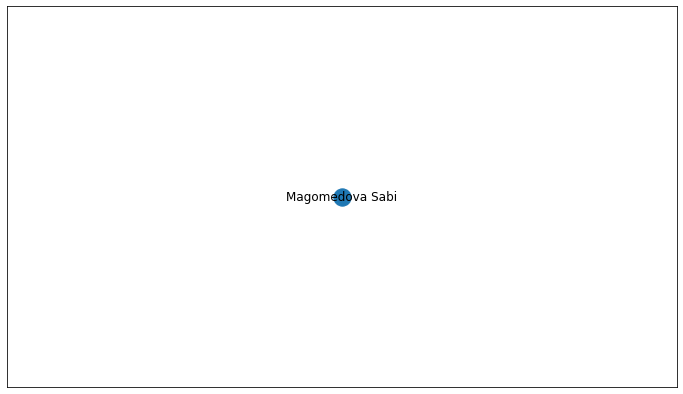

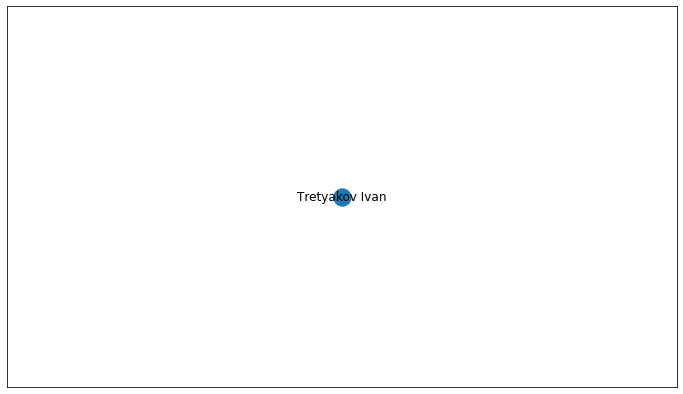

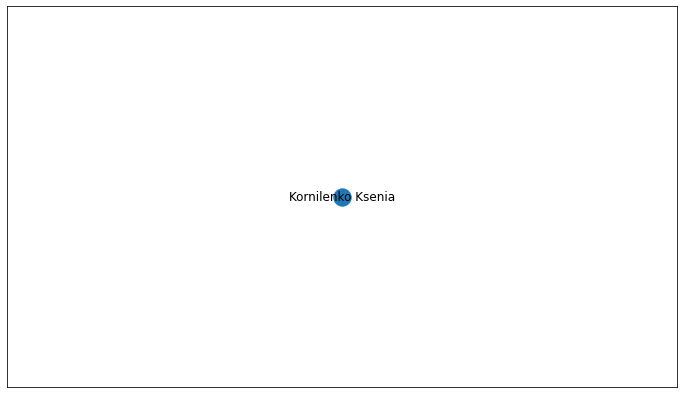

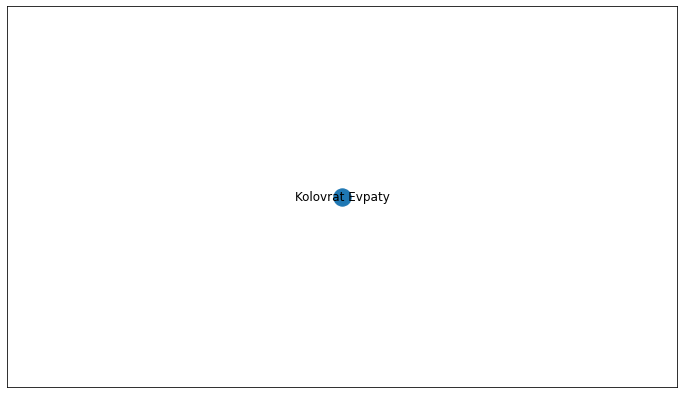

In [26]:
for comp in conn_components:
  plt.figure(figsize=(12, 7))
  G1 = nx.Graph()
  G1.add_nodes_from(comp)
  for node in comp:
    G1.nodes[node]['name'] = G.nodes[node]['name']
  G1.add_edges_from([edge for edge in G.edges if edge[0] in comp and edge[1] in comp])
  nx.draw_networkx(G1, 
                  pos = nx.kamada_kawai_layout(G1),
                  labels = {node: G1.nodes[node]['name'] for node in G1.nodes});

In [27]:
for conn_comp in conn_components:
  print(len(conn_comp))

795
1
1
1
1
1
1
1
1
1
1
1
1
1
3
1
1
1
1
1
1
1
1
1
1
1
1
2
1
1
1
1
1
1
1
1
1
1
1
1


Let's analyse first component, since other are not interesting (they're too small)

In [28]:
G1 = nx.Graph()
comp = conn_components[0]
G1.add_nodes_from(comp)
for node in comp:
  G1.nodes[node]['name'] = G.nodes[node]['name']
G1.add_edges_from([edge for edge in G.edges if edge[0] in comp and edge[1] in comp])

In [29]:
G = G1

In [30]:
print('Radius: ', nx.radius(G))
print('Diameter: ', nx.diameter(G))
print('Average shortest path length: ', nx.average_shortest_path_length(G))
print('Average clustering coefficient: ', nx.average_clustering(G))

Radius:  5
Diameter:  10
Average shortest path length:  2.9584810607860845
Average clustering coefficient:  0.43144705352019047


In [ ]:
def draw_histogram(data, max_data, n_bins, label):
  bin_data = [0] * n_bins
  bin_borders = [(i * max_data / n_bins, (i + 1) * max_data / n_bins) for i in range(n_bins)]
  for item in data:
    for i, borders in enumerate(bin_borders):
      l, r = borders
      if l <= item < r:
        bin_data[i] += 1
        break
  plt.figure(figsize=(12, 7))
  plt.bar([bb[0] for bb in bin_borders], bin_data, width=max_data / n_bins / 2)
  plt.title(label)
  plt.xticks([bb[0] for bb in bin_borders])
  plt.show();

In [31]:
import math

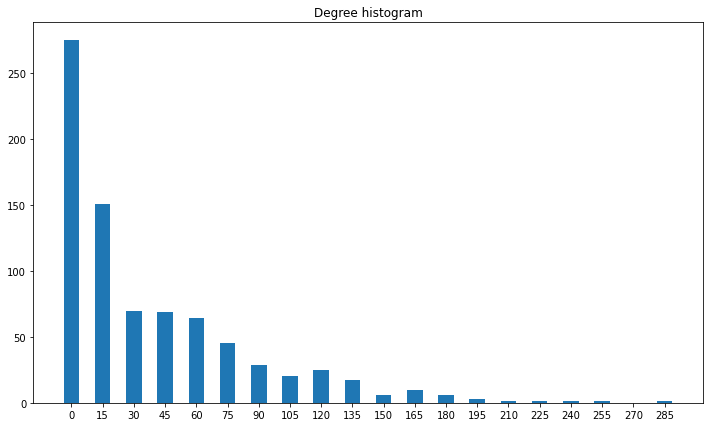

In [ ]:
degs = [deg for _, deg in G.degree]
draw_histogram(degs, math.ceil(max(degs) / 100) * 100, 20, "Degree histogram")

In [ ]:
shortest_paths = [p for p in list(nx.shortest_path_length(G))[0][1].values()]

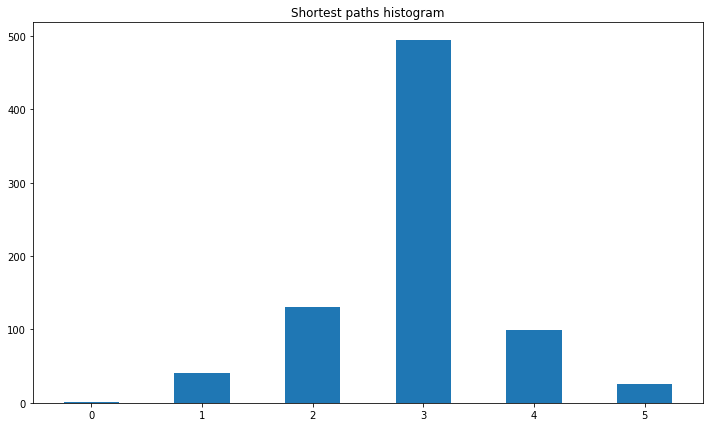

In [ ]:
draw_histogram(shortest_paths, 
               max(shortest_paths), 6, 
               "Shortest paths histogram")

In [ ]:
local_coefficient = [cl for _, cl in nx.clustering(G).items()]

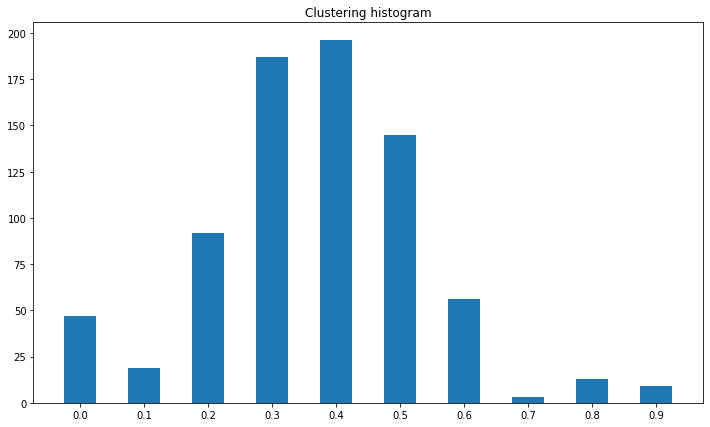

In [ ]:
draw_histogram(local_coefficient, max(local_coefficient), 10, "Clustering histogram")

In [32]:
import numpy as np

In [33]:
def random_edges(nodes, p):
    ### BEGIN SOLUTION
    
    # Option 1: efficient approach
    lp = np.log(1.0 - p)
    edges = []
    n = len(nodes)
    w = -1
    v = 1
    while v < n:
        lr = np.log(1.0 - np.random.random())
        w = w + 1 + int(lr/lp)
        while w >= v and v < n:
            w = w - v
            v = v + 1
        if v < n:
            edges.append((nodes[v-1], nodes[w-1]))
    return np.array(edges)
    
    # Option 2: naive approach
    edges = []
    for i in range(len(nodes)):
        for j in range(i + 1, len(nodes)):
            n_i, n_j = nodes[i], nodes[j]
            if np.random.random() < p:
                edges.append((nodes[i], nodes[j]))
    return np.array(edges)

    ### END SOLUTION


def erdos_renyi_graph(n, p):
    G = nx.Graph()
    nodes = np.arange(n)
    G.add_nodes_from(nodes)
    G.add_edges_from(random_edges(nodes, p))
    return G

In [34]:
def rewire(G, node, k, p):
    for i in range(1, k // 2 + 1):
        next_edge_v = (node + i) % len(G.nodes)
        if np.random.random() < p:
            G.remove_edge(node, next_edge_v) 
            while True:
                candidate = np.random.randint(len(G.nodes))
                if candidate != node and candidate != next_edge_v and not G.has_edge(node, candidate):
                    G.add_edge(node, candidate)
                    break

    return G
    

'''Do not touch the cell'''
def watts_strogatz_graph(n, k, p):
    G = ring_lattice(n, k)
    for node in G.nodes:
        rewire(G, node, k, p)
    return G


def ring_lattice(n, k):
    def adjacent_edges(nodes, halfk):
        n = len(nodes)
        for i, u in enumerate(nodes):
            for j in range(i + 1, i + halfk + 1):
                v = nodes[j % n]
                yield u, v
    G = nx.Graph()
    nodes = range(n)
    G.add_nodes_from(nodes)
    G.add_edges_from(adjacent_edges(nodes, k//2))
    return G

In [35]:
'''Do not touch the cell'''
def barabasi_albert_graph(n, m, random_seed=1):
    G = nx.star_graph(m)
    for i in range(1, n - m):
        attach(m + i, G, m)
    return G

def attach(node, G, m):
    edges = list()
    chosen = set()
    choices = list()
    for edge in G.edges:
        f, t = edge
        choices.extend([f, t])
    choices = np.array(choices)
    for i in range(m):
        choice = np.random.choice(choices)
        while choice in chosen:
            choice = np.random.choice(choices)

        chosen.add(choice)
        edges.append((node, choice))
    G.add_node(node)
    G.add_edges_from(edges)
    return G

In [36]:
from tqdm import tqdm 


def find_best_graph(GG, generator_function, args_generator, measure):
  ideal = measure(GG)
  best_args = None
  best_diff = ideal * 100
  for args in tqdm(args_generator):
    G_comp = generator_function(len(GG.nodes), *args)
    cur_measure = measure(G_comp)
    if best_args is None or abs(cur_measure - ideal) < best_diff:
      best_diff = abs(cur_measure - ideal)
      best_args = args
  return best_args

In [37]:
len(G.nodes)

795

In [ ]:
def gen():
  for i in range(1, 21):
    yield (i / 20,)


find_best_graph(G,
                erdos_renyi_graph,
                gen(),
                nx.average_clustering)

In [153]:
best_erdesh = 0.45

In [159]:
g_gen = erdos_renyi_graph(len(G.nodes), best_erdesh)

In [160]:
nx.average_clustering(g_gen)

0.4512058127483395

In [170]:
abs(0.431447 - 0.4512058127483395)

0.01975881274833946

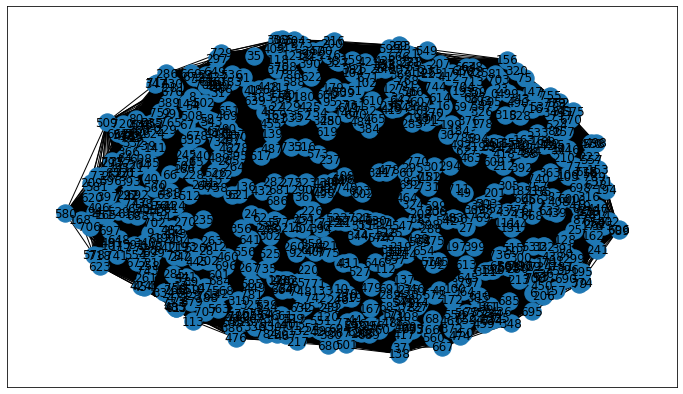

In [162]:
plt.figure(figsize=(12, 7))
nx.draw_networkx(g_gen)

In [ ]:
def gen(n):
  for i in range(1, n - 1):
    yield (i,)

find_best_graph(G,
                barabasi_albert_graph,
                gen(len(G)),
                nx.average_clustering)

In [41]:
best_barabasi = 165

In [163]:
g_gen = barabasi_albert_graph(len(G.nodes), best_barabasi)

In [164]:
nx.average_clustering(g_gen)

0.4311950983488473

In [171]:
abs(0.431447 - 0.4311950983488473)

0.00025190165115274166

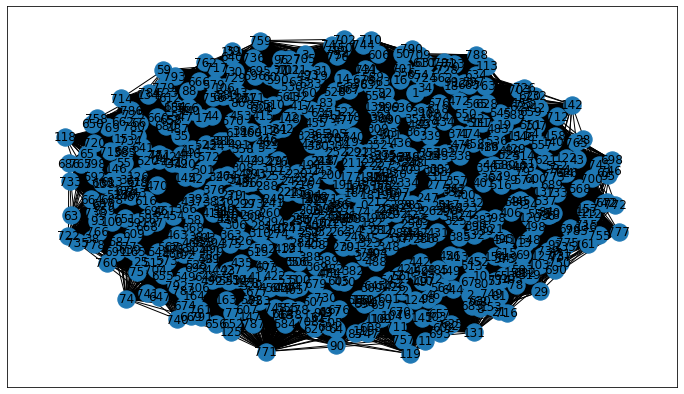

In [165]:
plt.figure(figsize=(12, 7))
nx.draw_networkx(g_gen)

In [ ]:
def gen(n):
  for i in range(1, (n - 1) // 50):
    for p in range(1, 11):
      yield (i * 50, p / 10)

find_best_graph(G,
                watts_strogatz_graph,
                gen(len(G)),
                nx.average_clustering)

In [166]:
best_watts = (144, 0.2)


In [167]:
g_gen = watts_strogatz_graph(len(G.nodes), *best_watts)


In [168]:
nx.average_clustering(g_gen)

0.42960391795394903

In [172]:
abs(0.431447 - 0.42960391795394903)

0.0018430820460509922

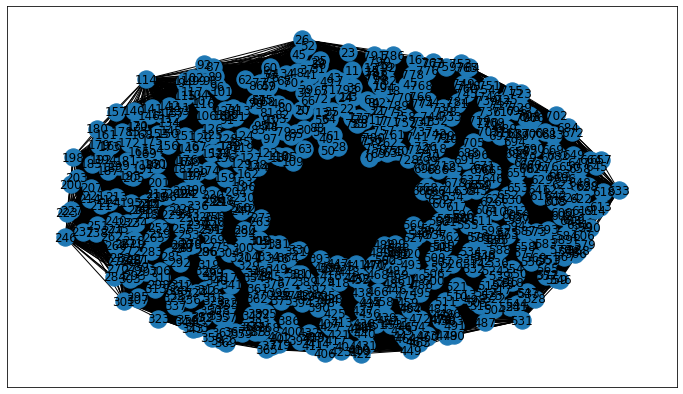

In [169]:
plt.figure(figsize=(12, 7))
nx.draw_networkx(g_gen)

In [ ]:
import pandas as pd

In [ ]:
def top10_centralities(G: nx.Graph) -> tp.Dict[str, pd.DataFrame]:
    """
    Create table of top 10 nodes by degree, closeness, betweenness centralities
    
    :param G: graph of Moscow undeground
    :return: mapping of station name to the dataframe with columns (station, line, centrality)
    """
    ### BEGIN SOLUTION
    cases = [['degree', nx.degree_centrality(G)], 
             ['closeness', nx.closeness_centrality(G)], 
             ['betweenness', nx.betweenness_centrality(G)]]
    dfs = {}
    for title, centrality in cases:
        top = sorted(centrality.items(), key=lambda i: i[1], reverse=True)[:10]
        name = [G.nodes[i]['name'] for i, val in top]
        centr_value = [val for i, val in top]
        dfs[title] = pd.DataFrame({'name': name, 
                                   'centrality': centr_value})
    return dfs

In [ ]:
top10_centralities(G)

{'betweenness':                name  centrality
 0    Nosirov Nusrik    0.076974
 1   Ivanenko Alexey    0.041796
 2   Sharapov Viktor    0.041211
 3    Gostkina Alisa    0.036435
 4    Goncharova Ann    0.031783
 5  Lukoyanov Artyom    0.031312
 6  Naumenko Nikolay    0.030848
 7   Ragimova Kamila    0.030847
 8     Abramov Maxim    0.028895
 9       Zueva Nadya    0.026873,
 'closeness':                    name  centrality
 0            Polin Oleg    0.484146
 1  Kalgushkina Veronika    0.476019
 2     Blagodarny Evgeny    0.472057
 3         Abramov Maxim    0.471217
 4   Grishutin Alexander    0.471217
 5      Gazizullin Malik    0.470658
 6      Naumenko Nikolay    0.464056
 7         Gridasov Ilya    0.462704
 8      Parfyonova Yulya    0.462704
 9         Ayvazov Denis    0.462434,
 'degree':                    name  centrality
 0            Polin Oleg    0.363980
 1   Grishutin Alexander    0.333753
 2  Kalgushkina Veronika    0.306045
 3      Parfyonova Yulya    0.294710
 4   

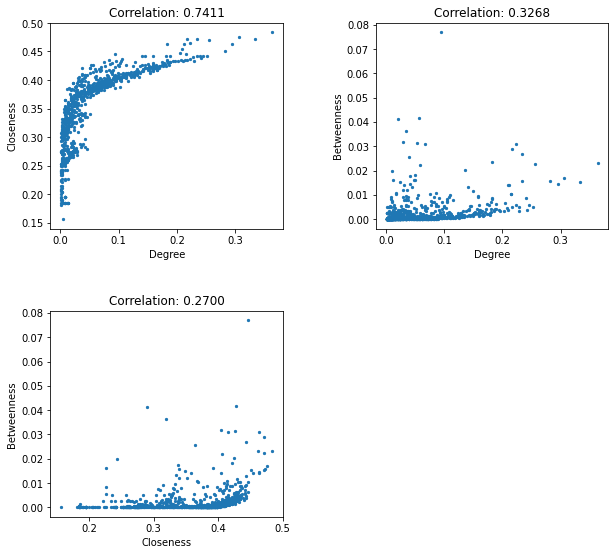

In [ ]:
def pearson_correlation(i_vals: np.array, j_vals: np.array) -> float:
    """
    Calculate Pearson correlation coefficient
    
    :param i_vals: array of centralities
    :param j_vals: array of centralities
    :return: Pearson's correlation
    """
    ### BEGIN SOLUTION
    return np.corrcoef(i_vals, j_vals)[0][1]
    ### END SOLUTION

centvals = [
    ('Degree', list(nx.degree_centrality(G).values())),
    ('Closeness', list(nx.closeness_centrality(G).values())),
    ('Betweenness', list(nx.betweenness_centrality(G).values())),
]

plt.figure(figsize=(2*5, 5*5))
plt.subplots_adjust(hspace=0.4, wspace=0.4)
k = 1
for i in range(len(centvals)):
    for j in range(i + 1, len(centvals)):
        i_label, i_vals = centvals[i]
        j_label, j_vals = centvals[j]
        correlation = pearson_correlation(i_vals, j_vals)
        plt.subplot(5, 2, k)
        plt.scatter(i_vals, j_vals, s=5)
        plt.title('Correlation: {:.4f}'.format(correlation))
        plt.xlabel(i_label)
        plt.ylabel(j_label)
        k += 1

корелляция небольшая

In [48]:
'''Do not touch the cell'''
def page_rank(G, alpha, k):
    A = nx.to_numpy_array(G)
    P = transition_matrix(A)
    v = teleportation_vector(A)
    rank = np.ones(A.shape[0]) / A.shape[0]
    for _ in range(k):
        rank = update_rank(rank, P, v, alpha)
    return np.array(rank)

In [49]:
def transition_matrix(A):
    result = np.zeros((len(A), len(A[0])))
    for i, row in enumerate(A):
        p = 1. / np.sum(row)
        for j, element in enumerate(row):
            if element == 1:
                result[i][j] = p
    return result

In [50]:
def teleportation_vector(A):
    n = len(A)
    return np.array([1 / n] * n)

def update_rank(rank, P, v, alpha):
    return alpha * P.T @ rank + (1 - alpha) * v

In [268]:
def draw_rank(alpha):
    plt.figure(figsize=(30, 30))
    pos = nx.spring_layout(G)


    top = nx.Graph()
    deg = list(sorted([(key, deg) for key, deg in G.degree], reverse=True))[:70]
    nodes = {node for node, _ in deg}
    top.add_nodes_from(nodes)
    edges = [edge for edge in G.edges if edge[0] in nodes and edge[1] in nodes]
    top.add_edges_from(edges)
    PR = page_rank(top, alpha, 10)

    nx.draw(top, 
            pos,
            edgecolors='black',
            cmap=plt.cm.hot,
            node_size=PR*3e3,
            node_color=PR,
            labels = {node: G.nodes[node]['name'] for node in G.nodes})
    plt.title('alpha is {}'.format(alpha))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in double_scalars
  after removing the cwd from sys.path.


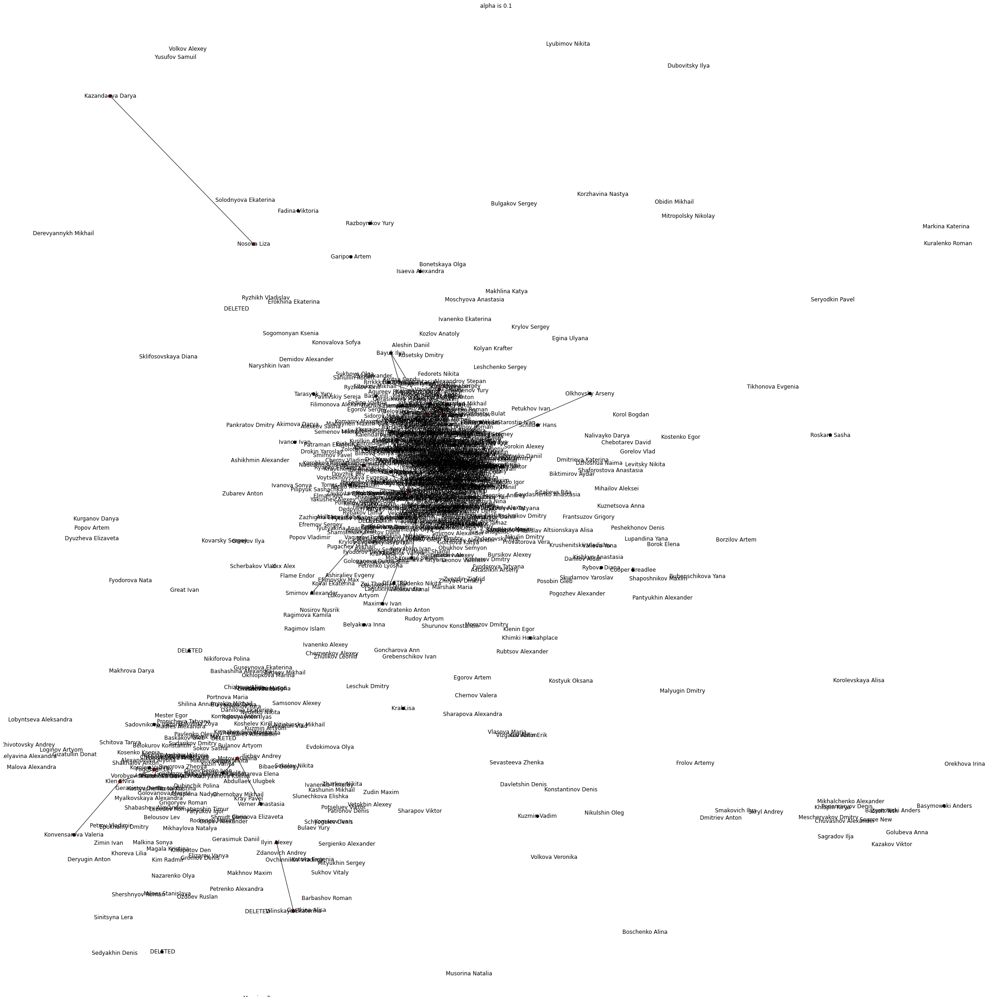

In [269]:
draw_rank(0.1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in double_scalars
  after removing the cwd from sys.path.


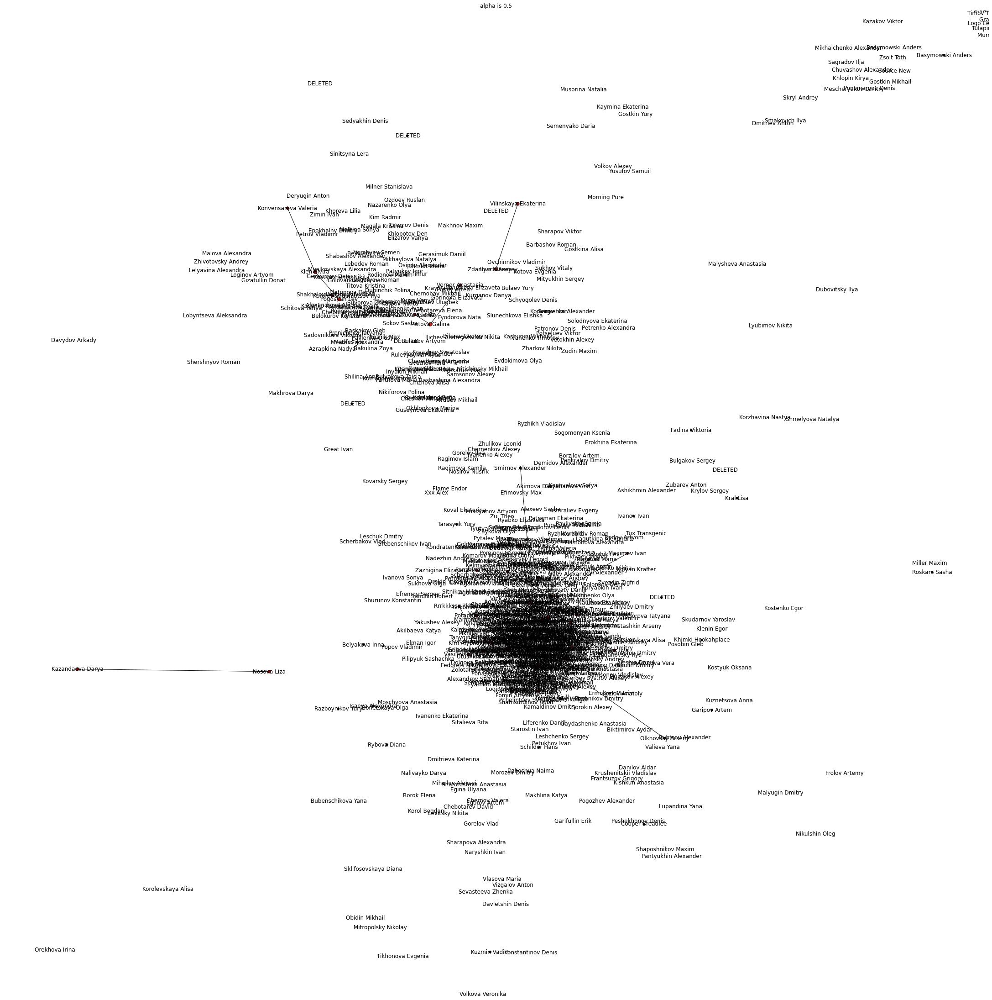

In [270]:
draw_rank(0.5)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in double_scalars
  after removing the cwd from sys.path.


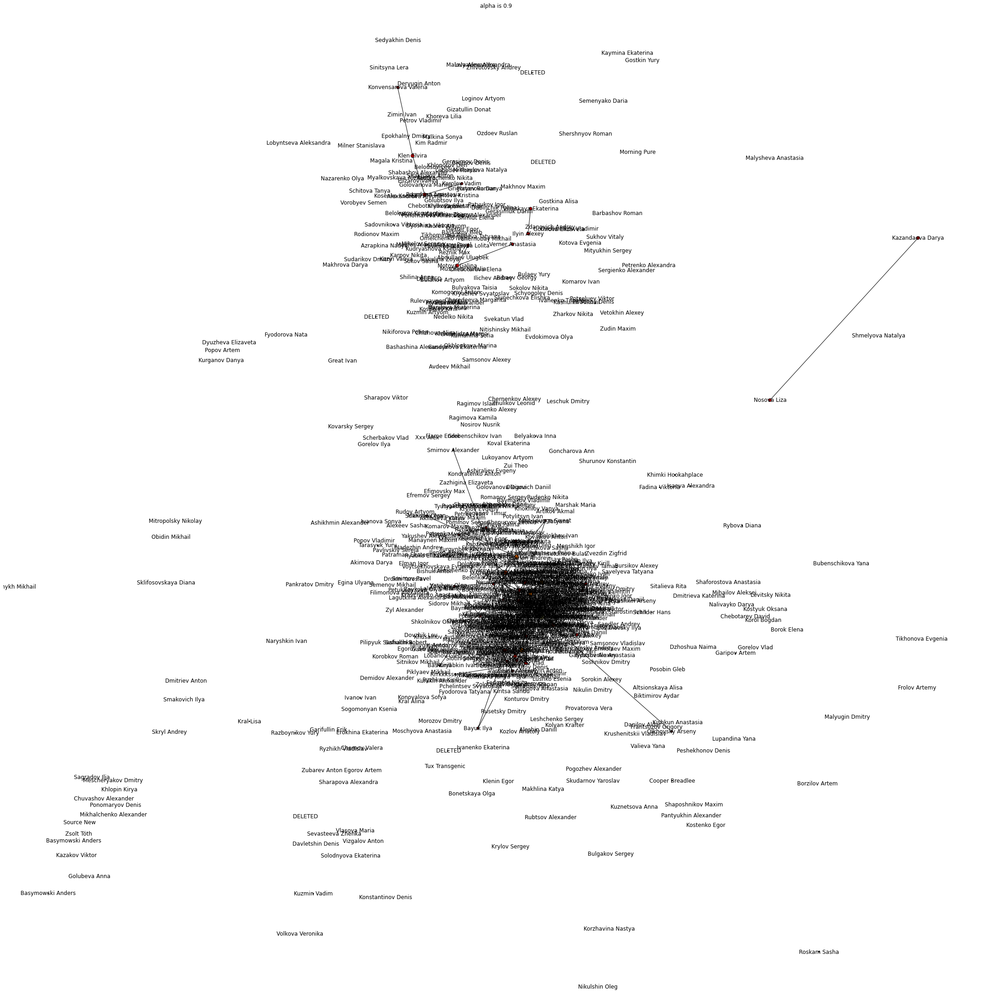

In [271]:
draw_rank(0.9)

In [51]:
def rank_degree_scatter(G, alpha, k):
    degree_centrality = nx.algorithms.centrality.degree_centrality(G)
    return plt.scatter(page_rank(G, alpha, k), degree_centrality.values())

In [52]:
def draw_rank_degree(G, alpha):
  plt.figure(figsize=(12, 7))

  scatter = rank_degree_scatter(G, alpha, 30)
  sc_data = scatter.get_offsets().data
  plt.xlabel('PageRank')
  plt.ylabel('Degree centrality')
  plt.title('alpha %0.2f' % alpha)

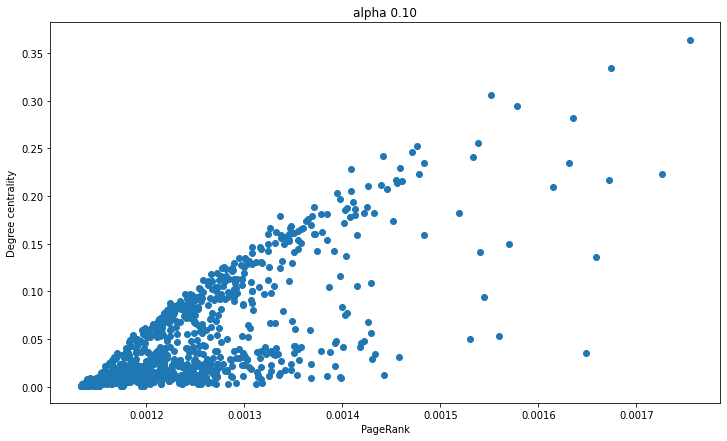

In [53]:
draw_rank_degree(G, 0.1)

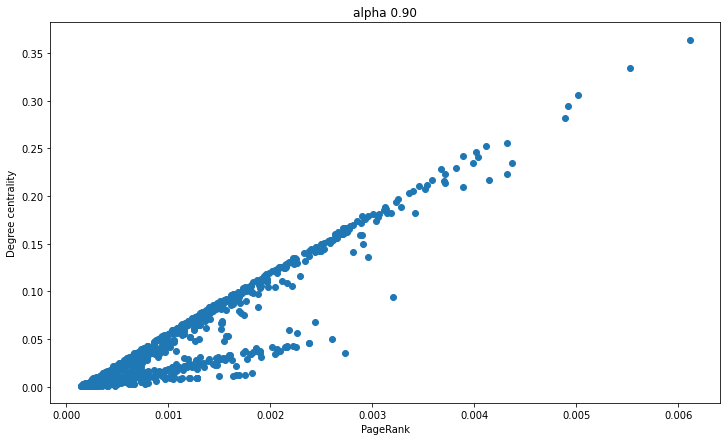

In [54]:
draw_rank_degree(G, 0.9)

In [74]:
from sklearn.metrics.pairwise import cosine_similarity


In [75]:
def sim_matrices(G):
    ### BEGIN SOLUTION
    A = nx.to_numpy_array(G)
    corr = np.corrcoef(A)
    J = np.zeros(A.shape)
    for i, j, c in nx.jaccard_coefficient(nx.from_numpy_array(A)):
        J[i, j] = c
        J[j, i] = c
    cos = cosine_similarity(A)
    return A, corr, J, cos
    ### END SOLUTION

In [76]:
A, corr, J, cos = sim_matrices(G)


In [78]:
import seaborn as sns

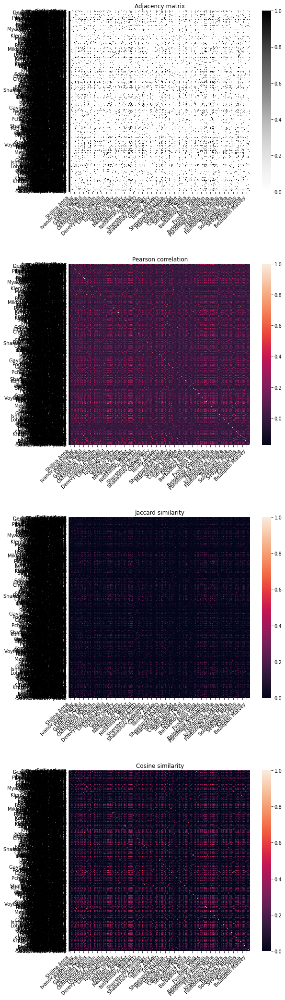

In [80]:
fig = plt.figure(figsize=(9, 9*4))
plt.subplots_adjust(hspace=0.4, wspace=0.4)
cases = [[1, A, plt.cm.Greys, 'Adjacency matrix'], 
         [2, corr, None, 'Pearson correlation'], 
         [3, J, None, 'Jaccard similarity'], 
         [4, cos, None, 'Cosine similarity'], ]
for i, matrix, cmap, t in cases:
    plt.subplot(4, 1, i)
    hmap = sns.heatmap(
        matrix,
        cmap=cmap,
        square=True,
        yticklabels=[G.nodes[i]['name'] for i in G.nodes])
    hmap.set_xticklabels(
        labels=[G.nodes[i]['name'] for i in G.nodes], 
        rotation=45, 
        horizontalalignment='right')
    plt.title(t)

In [81]:
def k_core_decompose(G):
    ### BEGIN SOLUTION
    return np.array(list(nx.core_number(G).values()))
    ### END SOLUTION

In [83]:
pos = nx.kamada_kawai_layout(G)

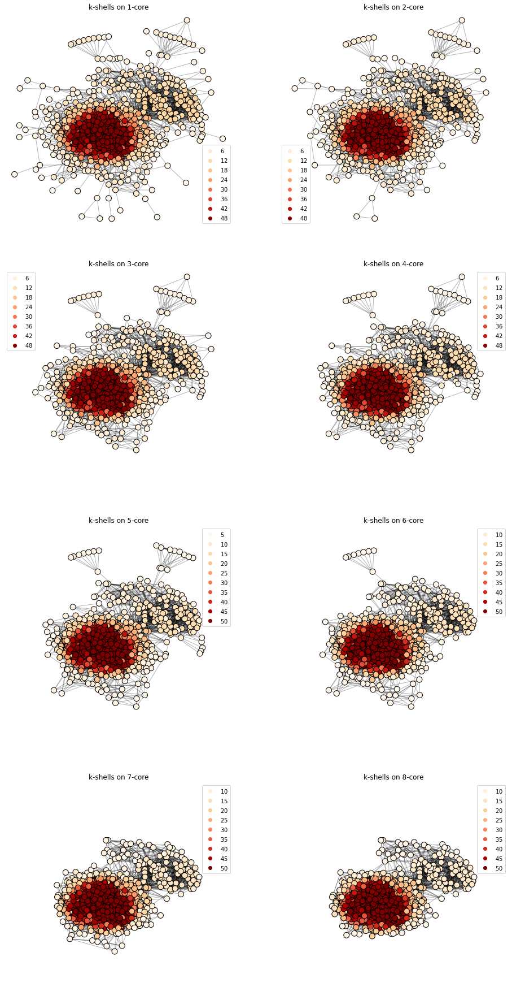

In [84]:
plt.figure(figsize=(8*2, 8*4))

x_max, y_max = np.array(list(pos.values())).max(axis=0)
x_min, y_min = np.array(list(pos.values())).min(axis=0)

for i in range(8):
    plt.subplot(4, 2, i+1)
    subG = nx.k_core(G, i+1)
    nodes = nx.draw_networkx_nodes(
        subG, 
        pos,
        cmap=plt.cm.OrRd,
        node_color=k_core_decompose(subG), 
        node_size=100, 
        edgecolors='black'
    )
    nx.draw_networkx_edges(
        subG, 
        pos,
        alpha=0.3,
        width=1, 
        edge_color='black'
    )
    eps = (x_max - x_min) * 0.05
    plt.xlim(x_min-eps, x_max+eps)
    plt.ylim(y_min-eps, y_max+eps)
    plt.legend(*nodes.legend_elements())
    plt.axis('off')
    plt.title('k-shells on {}-core'.format(i+1))

In [86]:
def largest_cliques(G):
    ### BEGIN SOLUTION
    cmap = plt.cm.rainbow
    cliques = [i for i in nx.find_cliques(G)]
    max_size = len(max(cliques, key=len))
    colors = []
    widths = []
    i = 0
    for c in cliques:
        if len(c) == max_size:
            c_colors = []
            for node in G.nodes:
                c_colors.append(cmap(i*0.5)[:3] if node in c else (1, 1, 1))
            i += 1
            colors.append(c_colors)
            c_width = []
            for e in G.edges:
                c_width.append(1.01 if set(e).issubset(c) else 1)
            widths.append(c_width)
    return np.array(colors), np.array(widths)
    ### END SOLUTION

In [87]:
colors, widths = largest_cliques(G)


In [173]:
len(colors)

15

In [89]:
size = np.unique(colors[0], axis=0, return_counts=True)[1][0]


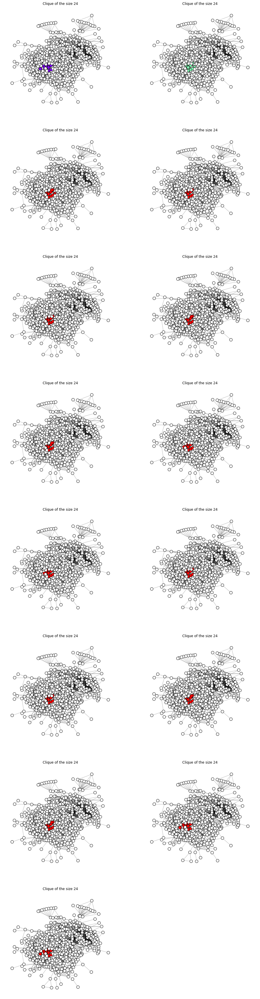

In [94]:
plt.figure(figsize=(8*2, 8 * size / 2))

for i in range(colors.shape[0]):
    
    b_edges = np.array(list(G.edges))[widths[i] == widths[i].max()]
    
    plt.subplot(math.ceil(size / 2), 2, i+1)
    nodes = nx.draw_networkx_nodes(
        G, 
        pos,
        node_color=colors[i], 
        node_size=100, 
        linewidths=1, 
        edgecolors='black'
    )
    nx.draw_networkx_edges(
        G,
        pos,
        alpha=0.3,
        width=widths[i].min()
    )
    nx.draw_networkx_edges(
        G,
        pos,
        width=widths[i].max(),
        edgelist=b_edges
    )
    plt.title('Clique of the size {}'.format(size))
    plt.axis('off')

In [98]:
for nc, clique in enumerate(colors):
  cnt = 0
  print("clique", nc)
  for i, color in enumerate(clique):
    if not (color[0] == color[1] == color[2] == 1.):
      cnt += 1
      print(G.nodes[list(G.nodes)[i]]['name'])

clique 0
Polin Oleg
Bezlepkin Matvey
Puzyna Elizaveta
Yushina Ekaterina
Podkidyshev Alexey
Kalgushkina Veronika
Proskurin Dmitry
Geller Misha
Sakovets Natalia
Davletshina Kamilla
Goncharov Vladimir
Shavrina Anna
Kositsyn Pasha
Pogrebnaya Alexandra
Grosul Kirill
Shaydurova Ekaterina
Parfyonova Yulya
Klimovitsky Roman
Mikhaylova Yana
Kuleshov Igor
Nelampovaya Tyan
Kondakova Alina
Bedrinsky Egor
Grishutin Alexander
clique 1
Polin Oleg
Puzyna Elizaveta
Yushina Ekaterina
Podkidyshev Alexey
Kalgushkina Veronika
Ratner Maxim
Geller Misha
Sakovets Natalia
Davletshina Kamilla
Goncharov Vladimir
Shavrina Anna
Erlikh Ivan
Kositsyn Pasha
Pogrebnaya Alexandra
Grosul Kirill
Shaydurova Ekaterina
Parfyonova Yulya
Terzi Vladislav
Zertsalov Andrey
Kuleshov Igor
Kondakova Alina
Yakupova Adelina
Bedrinsky Egor
Grishutin Alexander
clique 2
Polin Oleg
Puzyna Elizaveta
Yushina Ekaterina
Podkidyshev Alexey
Kalgushkina Veronika
Ratner Maxim
Geller Misha
Sakovets Natalia
Davletshina Kamilla
Goncharov Vladimir
S

Клики среди физтехов наблюдаются

In [110]:
def edge_betw_modularity(G, n):
  modularity = np.zeros(n)
  for i, comm in enumerate(nx.algorithms.community.girvan_newman(G)):
    if i == n:
      break
    modularity[i] = nx.algorithms.community.modularity(G, comm)
  return modularity

In [111]:
n_iterations = 20
modularity = edge_betw_modularity(G, n_iterations)

KeyboardInterrupt: ignored

In [ ]:
plt.figure(figsize=(6, 4))
plt.plot(np.arange(n_iterations)+2, modularity)
best_n = np.argmax(modularity) + 2
label = 'number of communities with max modularity {:.2f}'.format(max(modularity))
plt.plot(
    [best_n, best_n], [min(modularity), max(modularity)], 
    'k--', c='tab:red', 
    label=label
)
plt.ylabel('Modularity score')
plt.xlabel('Number of communities')
plt.legend(loc='upper left')
plt.ylim((modularity.min(), 0.6))
plt.show()

In [99]:
def norm_laplacian(A):
  n = A.shape[0]
  D = np.eye(n) * A.sum(axis=0)
  D_sqrt = np.eye(n) * np.sqrt(1 / A.sum(axis=0))
  return D_sqrt @ (D - A) @ D_sqrt

In [101]:
A = nx.to_numpy_array(G)
L = norm_laplacian(A)

In [102]:
def spectral_embedding(L, n_components):
  _, eigh_vecs = np.linalg.eigh(L)
  return eigh_vecs[:, 1:n_components + 1]

In [103]:
embedding = spectral_embedding(L, 3)


In [104]:
def spectral_clustering(G, n_clusters, n_components):
    A = nx.to_numpy_array(G)
    L = norm_laplacian(A)
    embedding = spectral_embedding(L, n_components)
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(embedding)
    return kmeans.labels_

In [107]:
from sklearn.cluster import KMeans


In [130]:
def get_k_labels_for_each(G, labels, k):
  counts = dict()
  ls = {}
  for node_num, val in enumerate(labels):
    if val not in counts.keys():
      counts[val] = 1
      node = list(G.nodes)[node_num]
      ls[node] = G.nodes[node]['name']
    elif counts[val] < k:
      counts[val] += 1
      node = list(G.nodes)[node_num]
      ls[node] = G.nodes[node]['name']
  return ls

In [145]:
def get_k_samples_for_each(G, labels, k):
  counts = dict()
  ls = {}
  for node_num, val in enumerate(labels):
    if val not in counts.keys():
      counts[val] = 1
      node = list(G.nodes)[node_num]
      ls[val] = [G.nodes[node]['name']]
    elif counts[val] < k:
      counts[val] += 1
      node = list(G.nodes)[node_num]
      ls[val].append(G.nodes[node]['name'])
  return ls

In [147]:
labels = spectral_clustering(G, 4, 3)

for cl, people in get_k_samples_for_each(G, labels, 10).items():
  print("Cluster:", cl)
  for p in people:
    print(p)

Cluster: 1
Shilina Anna
Okhlopkova Marina
Loginov Artyom
Nitishinsky Mikhail
Shabashov Alexander
Barbashov Roman
Belokurov Konstantin
Ponomareva Anastasia
Portnova Maria
Danilova Ekaterina
Cluster: 0
Ivanov Vyacheslav
Podkin Pasha
Gazimova Aygul
Davletshin Denis
Derevyannykh Mikhail
Liferenko Daniil
Ivchenko Oleg
Gusev Dmitry
Borzilov Artem
Nadezhin Andrey
Cluster: 2
Khlopin Kirya
Mikhalchenko Alexander
Dmitriev Anton
Skryl Andrey
Chuvashov Alexander
Source New
Kazakov Viktor
Ponomaryov Denis
Mescheryakov Dmitry
Zsolt Tóth
Cluster: 3
Mumunov Mumu
Logo Eeerrr
Timov Tim
Gostkin Mikhail
Komarov Komar
Vovanov Vovan
Grachev Grach
Tulapin Mikhail


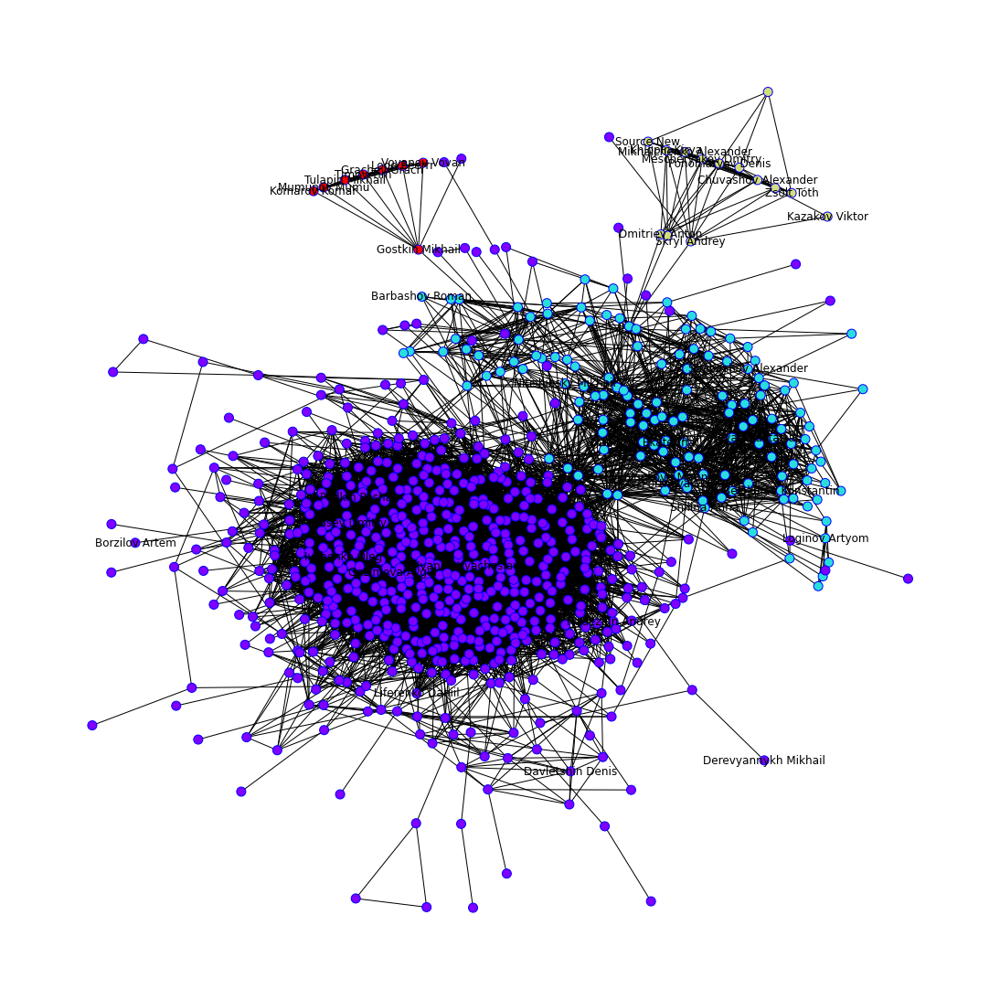

In [141]:

plt.figure(figsize=(15, 15))
nx.draw_kamada_kawai(
    G, 
    cmap=plt.cm.rainbow,
    node_color=labels, 
    edgecolors='blue', 
    node_size=100, labels=get_k_labels_for_each(G, labels, 10))

In [148]:
labels = spectral_clustering(G, 6, 3)
for cl, people in get_k_samples_for_each(G, labels, 10).items():
  print("Cluster:", cl)
  for p in people:
    print(p)

Cluster: 4
Shilina Anna
Shabashov Alexander
Belokurov Konstantin
Ponomareva Anastasia
Portnova Maria
Danilova Ekaterina
Inyakin Mikhail
Mikelov Sergey
Alexandrova Alyona
Myalkovskaya Alexandra
Cluster: 0
Ivanov Vyacheslav
Podkin Pasha
Gazimova Aygul
Davletshin Denis
Derevyannykh Mikhail
Liferenko Daniil
Ivchenko Oleg
Gusev Dmitry
Borzilov Artem
Nadezhin Andrey
Cluster: 3
Okhlopkova Marina
Loginov Artyom
Nitishinsky Mikhail
 DELETED
Shershnyov Roman
 DELETED
Shmelyova Natalya
Barbashov Roman
Sedyakhin Denis
Mityukhin Sergey
Cluster: 2
Khlopin Kirya
Skryl Andrey
Chuvashov Alexander
Ponomaryov Denis
Mescheryakov Dmitry
Zsolt Tóth
Basymowski Anders
Cluster: 5
Mikhalchenko Alexander
Dmitriev Anton
Source New
Kazakov Viktor
Smakovich Ilya
Sagradov Ilja
Basymowski Anders
Cluster: 1
Mumunov Mumu
Logo Eeerrr
Timov Tim
Gostkin Mikhail
Komarov Komar
Vovanov Vovan
Grachev Grach
Tulapin Mikhail


3 и 4 можно смержить в кластер - знакомые по дубне, 2 и 5 - по игре

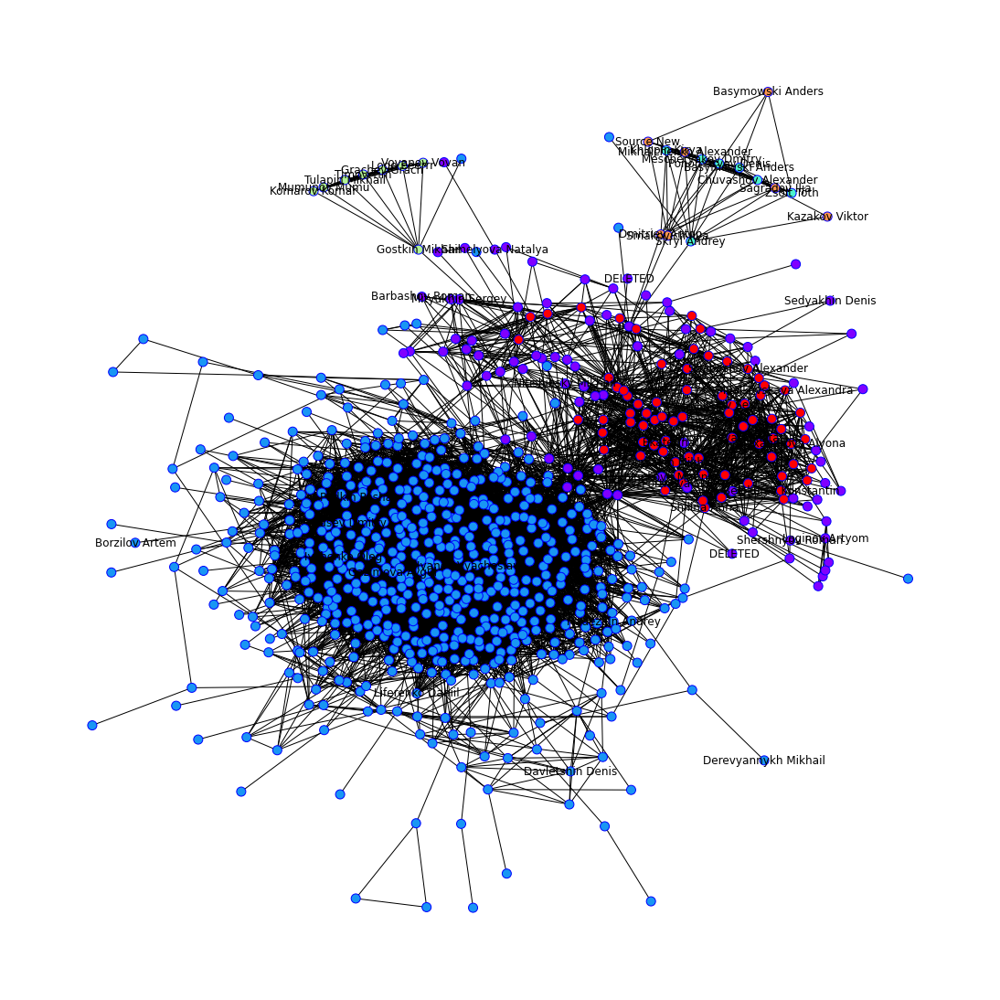

In [140]:
plt.figure(figsize=(15, 15))
nx.draw_kamada_kawai(
    G, 
    cmap=plt.cm.rainbow,
    node_color=labels, 
    edgecolors='blue', 
    node_size=100, labels=get_k_labels_for_each(G, labels, 10))

In [151]:
labels = spectral_clustering(G, 5, 3)

for cl, people in get_k_samples_for_each(G, labels, 15).items():
  print("Cluster:", cl)
  for p in people:
    print(p)

Cluster: 3
Shilina Anna
Shabashov Alexander
Belokurov Konstantin
Ponomareva Anastasia
Portnova Maria
Danilova Ekaterina
Inyakin Mikhail
Mikelov Sergey
Alexandrova Alyona
Myalkovskaya Alexandra
Kazakova Lolita
Lebedev Roman
Golovanova Marina
Kosenko Ksenia
Lapshin Timur
Cluster: 4
Ivanov Vyacheslav
Podkin Pasha
Gazimova Aygul
Davletshin Denis
Derevyannykh Mikhail
Liferenko Daniil
Ivchenko Oleg
Gusev Dmitry
Borzilov Artem
Nadezhin Andrey
Gadaev Tamaz
Garnov Yury
Ilenko Alexei
Marchenko Dmitry
Sharipov Fargat
Cluster: 0
Okhlopkova Marina
Loginov Artyom
Nitishinsky Mikhail
 DELETED
Shershnyov Roman
 DELETED
Shmelyova Natalya
Barbashov Roman
Sedyakhin Denis
Mityukhin Sergey
Komarov Ivan
Khoreva Lilia
Potseluev Viktor
Milner Stanislava
Malova Alexandra
Cluster: 1
Khlopin Kirya
Mikhalchenko Alexander
Dmitriev Anton
Skryl Andrey
Chuvashov Alexander
Source New
Kazakov Viktor
Ponomaryov Denis
Mescheryakov Dmitry
Zsolt Tóth
Smakovich Ilya
Basymowski Anders
Sagradov Ilja
Basymowski Anders
Cluster:

In [ ]:
кластер по дубне можно смержить

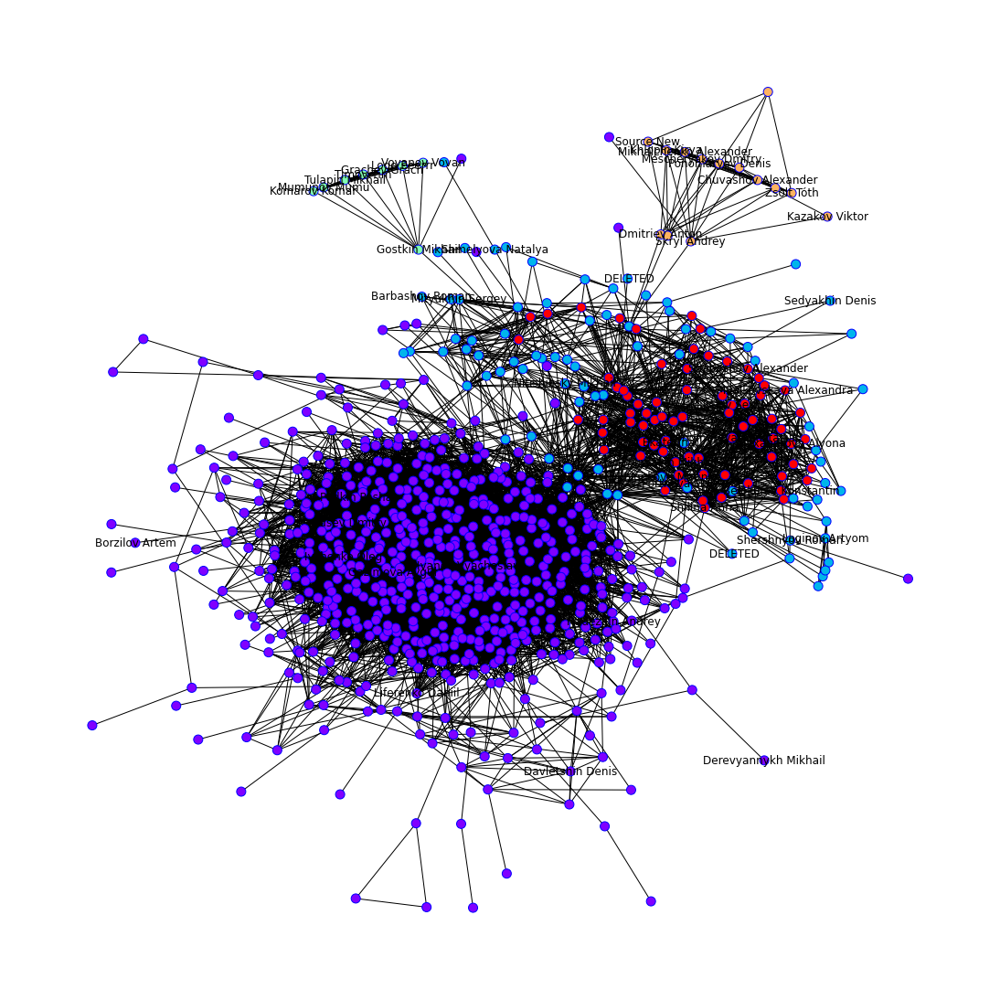

In [142]:
plt.figure(figsize=(15, 15))
nx.draw_kamada_kawai(
    G, 
    cmap=plt.cm.rainbow,
    node_color=labels, 
    edgecolors='blue', 
    node_size=100, labels=get_k_labels_for_each(G, labels, 10))

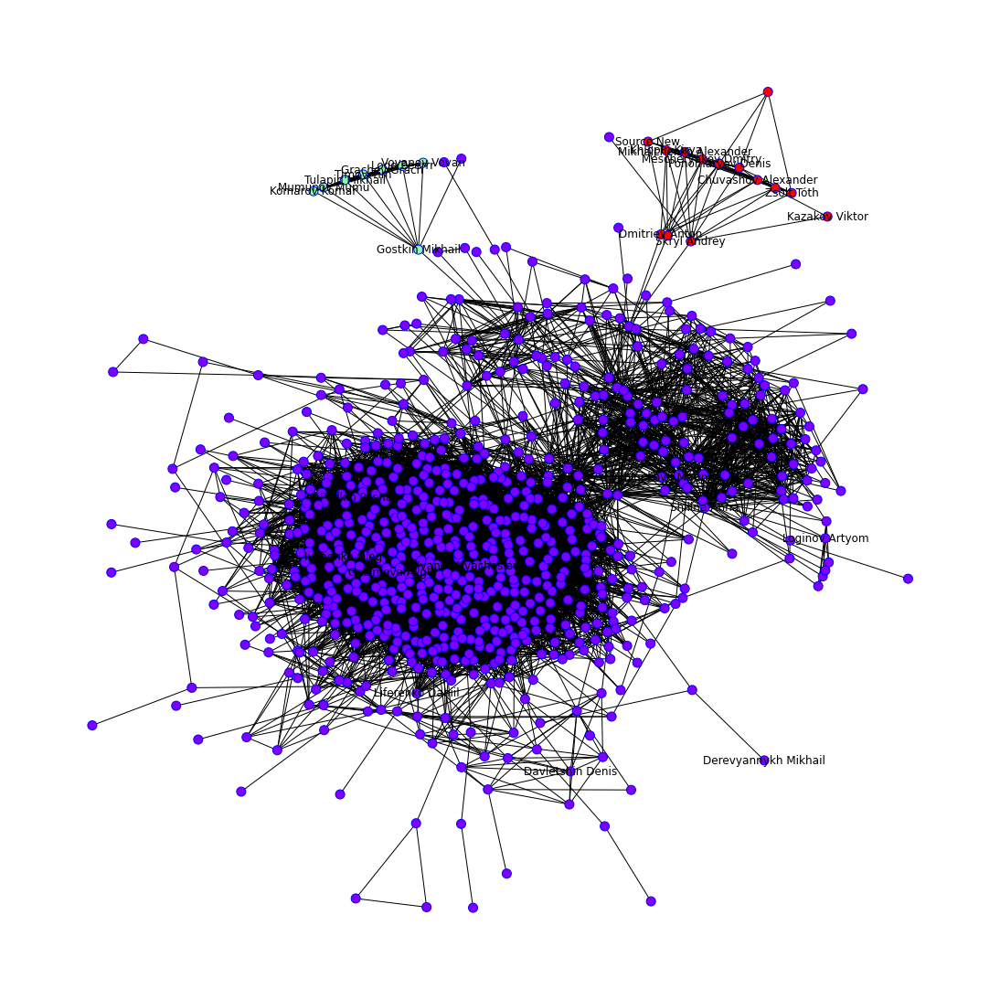

In [143]:
labels = spectral_clustering(G, 3, 3)
plt.figure(figsize=(15, 15))
nx.draw_kamada_kawai(
    G, 
    cmap=plt.cm.rainbow,
    node_color=labels, 
    edgecolors='blue', 
    node_size=100, labels=get_k_labels_for_each(G, labels, 10))

дубна и физтех/москва смешаны, недостаточно кластеров

оставляем 4 кластера